<a href="https://colab.research.google.com/github/NadiaSkifa/Dams_US/blob/main/SpatialPatternsDamUS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***Preparing the DataSets***


**Install and import the libraries needed**

In [1]:
!pip install --upgrade geopandas
!pip install pysal
!pip install libpysal
!pip install esda
!pip install mapclassify
!pip3 install contextily
!pip install fiona geopandas
!pip install pyshp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 7.4 MB/s eta 0:00:00
  Attempting uninstall: geopandas
    Found existing installation: geopandas 0.13.2
    Uninstalling geopandas-0.13.2:
      Successfully uninstalled geopandas-0.13.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.4/132.4 kB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.4/58.4 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.3/141.3 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.1/54.1 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.9/47.9 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 277.8/277.8 kB 26.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup

In [2]:
import pysal
import seaborn as sns
import pandas as pd
import geopandas as gpd
import shapefile as shp
import fiona
import numpy as np
import matplotlib.pyplot as plt
import contextily as ctx
import folium
import warnings
warnings.filterwarnings('ignore')

Connect Google Drive (Contains the data)

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


---

**Read the data Shapefile into a Geopandas geodataframe**

In [4]:
shp_barriers= "/content/drive/MyDrive/GDW_v1_delta_shp/GDW_barriers_v1_delta.shp"
shp_reservoirs= "/content/drive/MyDrive/GDW_v1_delta_shp/GDW_reservoirs_v1_delta.shp"

---
**Mapping the Geopandas geodataframe**

Plot the dams and reservoirs for the US


In [5]:
# Read shapefile into a GeoDataFrame
gdf_b = gpd.read_file(shp_barriers)
gdf_r= gpd.read_file(shp_reservoirs)

# Filter the GeoDataFrame to include only polygons of the USA
gdf_b_usa = gdf_b[gdf_b['COUNTRY'] == 'United States']
gdf_r_usa= gdf_r[gdf_r['COUNTRY']== 'United States']

In [6]:
shp_states="/content/drive/MyDrive/USA/states_2.shp"
gdf_states= gpd.read_file(shp_states)

In [7]:
gdf_states=gdf_states[gdf_states['NAME'] != "Puerto Rico"]
gdf_states=gdf_states[gdf_states['NAME'] != "U.S. Virgin Islands"]
gdf_states=gdf_states[gdf_states['NAME'] != "Guam"]

In [8]:
len(gdf_states)

51

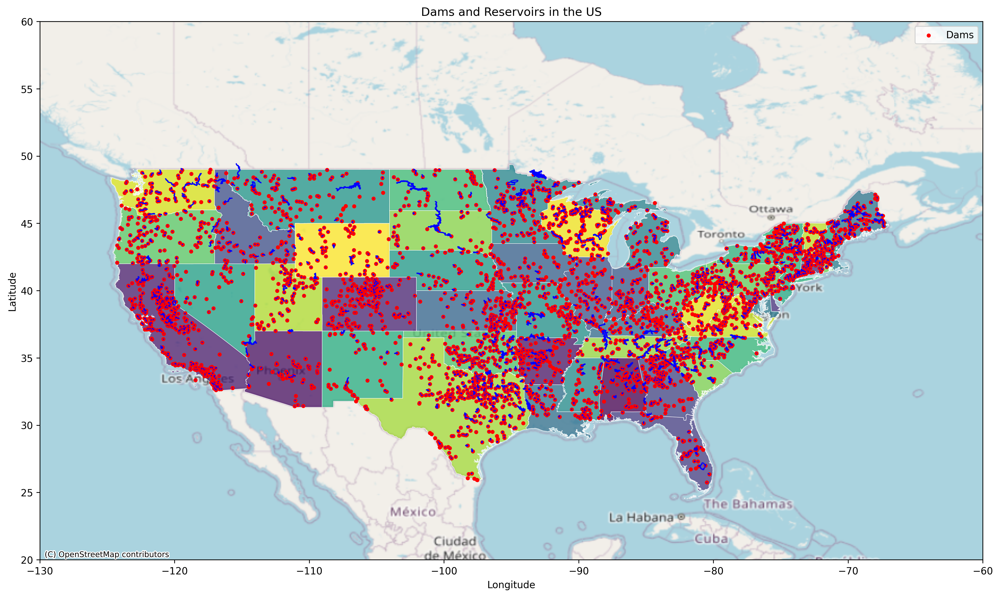

In [9]:
# Combine GeoDataFrames (big reservoirs and dams)
#gdf = gpd.GeoDataFrame(pd.concat([gdf_b_usa, gdf_r_usa], ignore_index=True))

fig, ax = plt.subplots(figsize=(30, 10), dpi=300)  # Set the figure size here

gdf_states.plot(
    ax=ax,
    column="NAME",
    cmap="viridis",
    edgecolor="white",
    linewidth=0.5,
    alpha=0.75,
    label='f{NAME}'
)
ax.set_xlim(-130,-60)
ax.set_ylim(20,60)
# Plot dams as points
gdf_b_usa.plot(ax=ax, color='red', markersize=10, label='Dams')

# Plot reservoirs as polygons
gdf_r_usa.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=1, label='Reservoirs')

# Add OpenStreetMap basemap
ctx.add_basemap(ax, crs=gdf_b_usa.crs, source=ctx.providers.OpenStreetMap.Mapnik)

# Add legend
ax.legend()

# Set title and labels

plt.title("Dams and Reservoirs in the US")
plt.xlabel("Longitude")
plt.ylabel("Latitude")

plt.show()

---

**Exploratory Data Analysis**

In [10]:
# Replace -99 with NaN in the specified columns
gdf_b_usa[['YEAR_DAM', 'CAP_REP', 'DAM_HGT_M', 'AREA_REP', 'CATCH_REP']] = gdf_b_usa[['YEAR_DAM', 'CAP_REP', 'DAM_HGT_M', 'AREA_REP', 'CATCH_REP']].replace(-99, np.nan)

# Calculate basic statistics using describe() and print the results
describe_stats = gdf_b_usa[['YEAR_DAM','CAP_REP', 'DAM_HGT_M', 'AREA_REP', 'CATCH_REP']].describe()
print("Basic Statistics:")
print(describe_stats)

# Calculate the percentage of NaN values for each column and print the results
nan_percentage = (gdf_b_usa[['YEAR_DAM','CAP_REP', 'DAM_HGT_M', 'AREA_REP', 'CATCH_REP']].isna().sum() / len(gdf_b_usa)) * 100
print("\nPercentage of NaN Values:")
print(nan_percentage)



Basic Statistics:
          YEAR_DAM       CAP_REP    DAM_HGT_M     AREA_REP      CATCH_REP
count  4249.000000   3588.000000  4281.000000  3872.000000    3603.000000
mean   1953.015533     99.513127    25.046952    13.026314    5393.257563
std      27.999130    917.336861    22.503902    59.860824   33383.149499
min    1825.000000      0.100000     1.000000     0.004000       0.000000
25%    1936.000000      1.000000    13.000000     0.263000      18.000000
50%    1961.000000      5.900000    18.000000     1.384000     100.000000
75%    1972.000000     25.100000    29.000000     6.200000    1067.000000
max    2016.000000  34852.000000   235.000000  1838.900000  997146.000000

Percentage of NaN Values:
YEAR_DAM     12.643914
CAP_REP      26.233553
DAM_HGT_M    11.986020
AREA_REP     20.394737
CATCH_REP    25.925164
dtype: float64


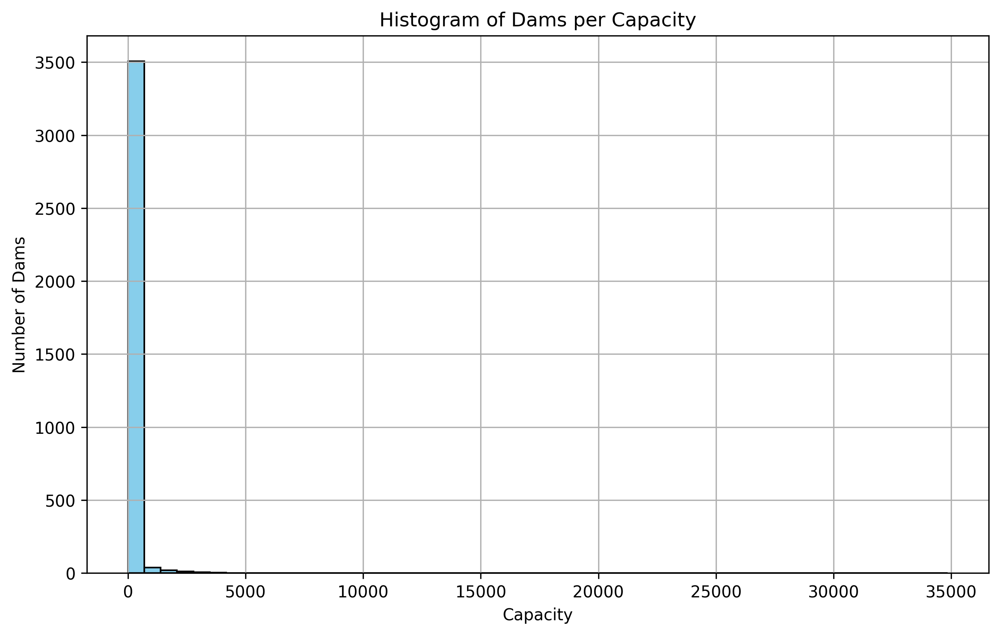

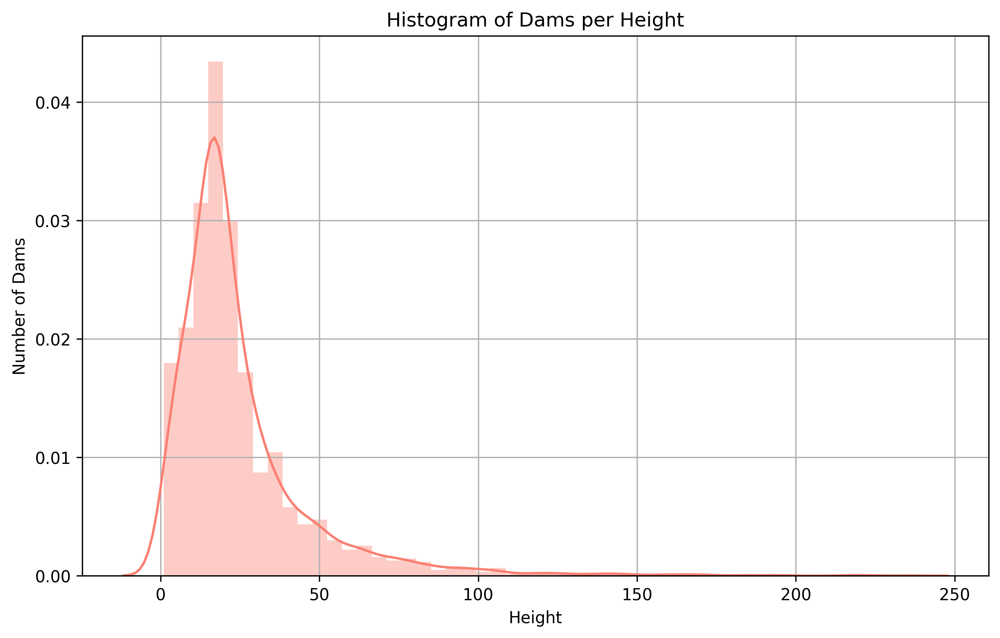

In [11]:
# Plot histogram of dams per capacity
plt.figure(figsize=(10, 6), dpi=300)
plt.hist(gdf_b_usa['CAP_REP'], bins=50, color='skyblue', edgecolor='black')
plt.title('Histogram of Dams per Capacity')
plt.xlabel('Capacity')
plt.ylabel('Number of Dams')
plt.grid(True)
plt.show()

# Plot histogram of dams per height
plt.figure(figsize=(10, 6), dpi=300)
sns.distplot(gdf_b_usa['DAM_HGT_M'], color='salmon')
plt.title('Histogram of Dams per Height')
plt.xlabel('Height')
plt.ylabel('Number of Dams')
plt.grid(True)
plt.show()

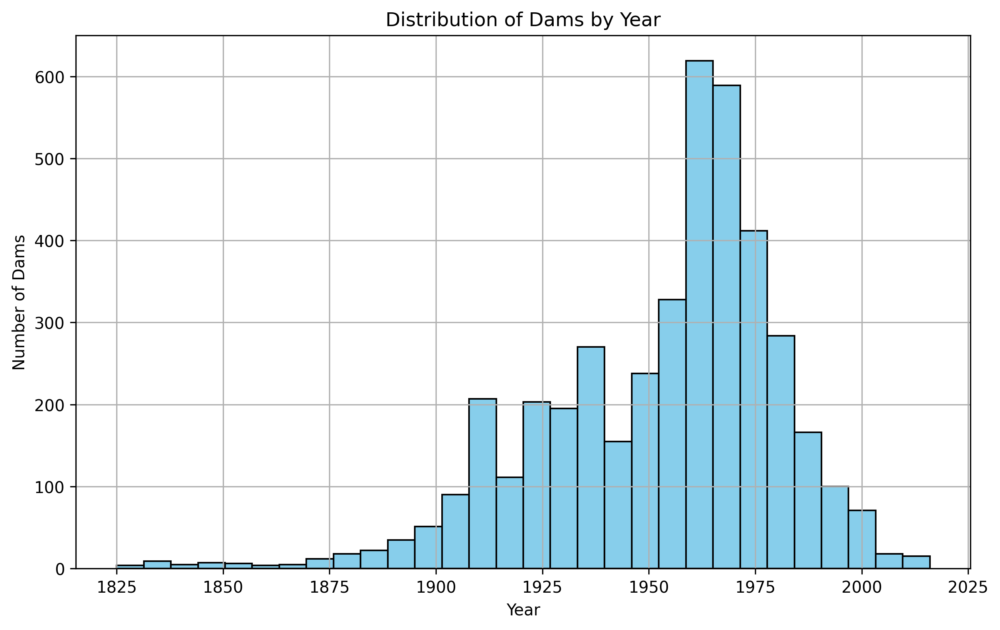

In [12]:
# Plot histogram of dams by year
gdf_b_usa=gdf_b_usa[gdf_b_usa['YEAR_DAM']!=-99]
plt.figure(figsize=(10, 6), dpi=300)
plt.hist(gdf_b_usa['YEAR_DAM'], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Dams by Year')
plt.xlabel('Year')
plt.ylabel('Number of Dams')
plt.grid(True)
plt.show()

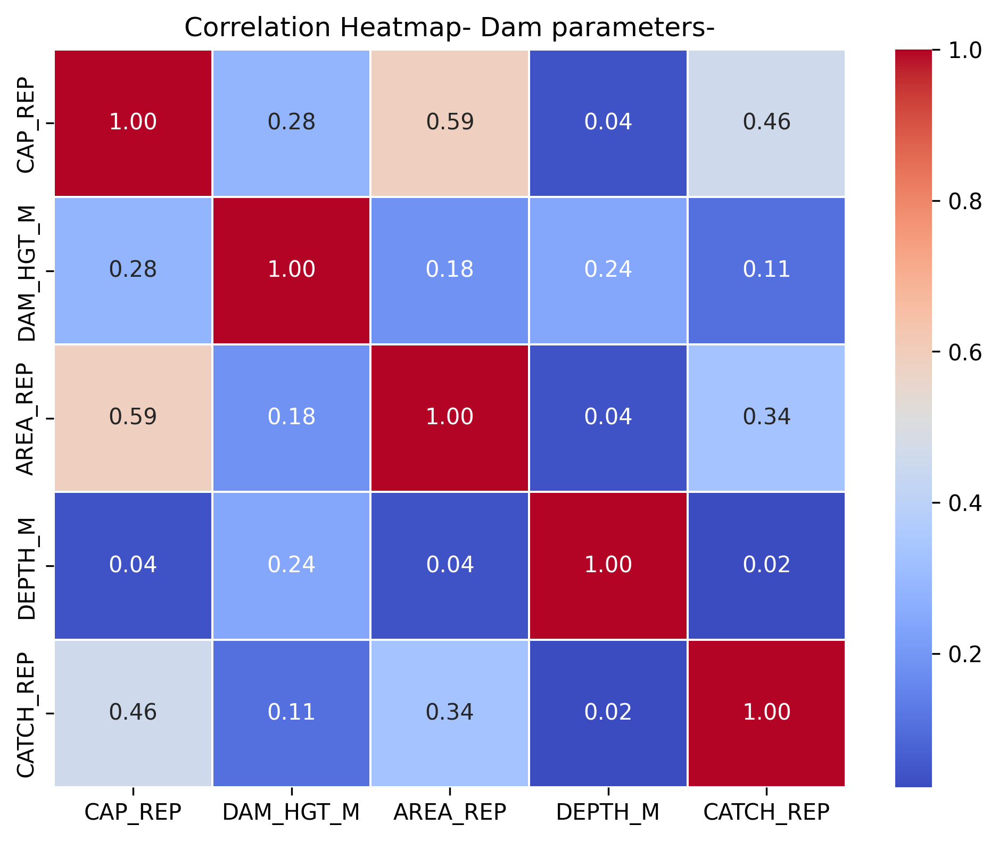

In [13]:
import seaborn as sns

# Select the columns for correlation
selected_columns = ['CAP_REP', 'DAM_HGT_M', 'AREA_REP', 'DEPTH_M', 'CATCH_REP']

# Subset the data to include only the selected columns
subset_data = gdf_b_usa[selected_columns]

# Calculate the correlation matrix
correlation_matrix = subset_data.corr()

# Create a heatmap
plt.figure(figsize=(8, 6),dpi=300)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap- Dam parameters-')
plt.show()


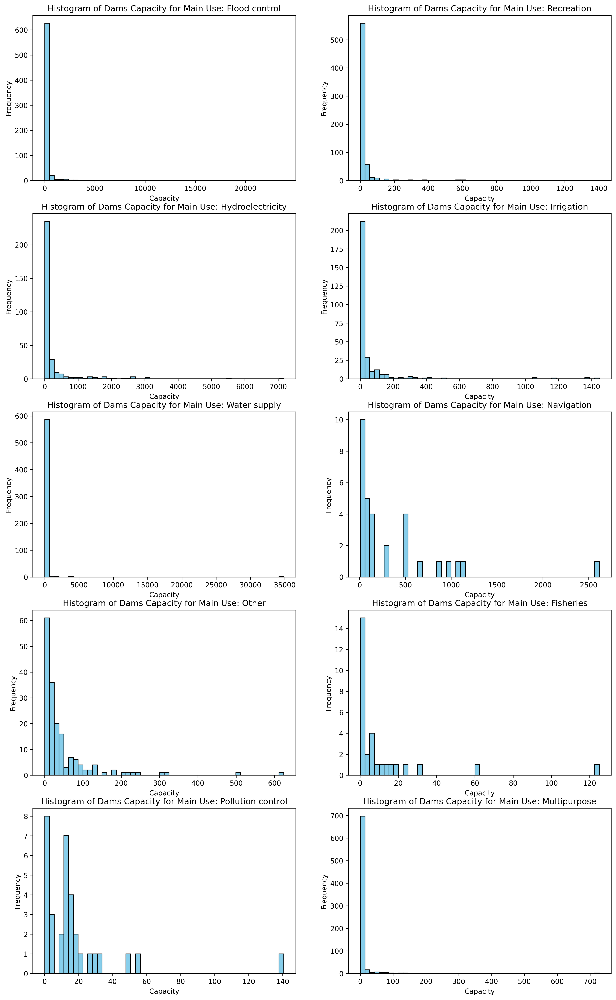

In [14]:
# Get unique main_use categories excluding None
main_use_categories = gdf_b_usa['MAIN_USE'].unique()
main_use_categories = [cat for cat in main_use_categories if cat is not None]

# Calculate the number of subplots needed
num_subplots = len(main_use_categories)

# Calculate the number of rows and columns for subplots
num_rows = (num_subplots // 2) + (1 if num_subplots % 2 != 0 else 0)
num_cols = 2

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows), dpi=300)

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Iterate over unique values of main_use and plot histograms
for i, main_use_category in enumerate(main_use_categories):
    # Filter the data for the current main_use category
    filtered_data = gdf_b_usa[gdf_b_usa['MAIN_USE'] == main_use_category]

    # Plot histogram for the current main_use category
    ax = axes[i]
    ax.hist(filtered_data['CAP_REP'], bins=50, color='skyblue', edgecolor='black')
    ax.set_title(f'Histogram of Dams Capacity for Main Use: {main_use_category}')
    ax.set_xlabel('Capacity')
    ax.set_ylabel('Frequency')

plt.show()

Remove outliers

In [15]:
# Data Cleaning
# Remove rows with -99 values in the 'capacity' column
gdf_b_usa= gdf_b_usa[gdf_b_usa['CAP_REP'] != -99]
#gdf_b_usa= gdf_b_usa[gdf_b_usa['ALT_HGT_M'] != -99]

*Summary Statistics for Numerical Attributes:*

In [16]:
# Calculate summary statistics for 'capacity' attribute
capacity_stats = gdf_b_usa['CAP_REP'].describe()
print("Summary Statistics for Capacity:\n", capacity_stats)

# Calculate summary statistics for 'height' attribute
height_stats = gdf_b_usa['ALT_HGT_M'].describe()
print("Summary Statistics for Height:\n", height_stats)

Summary Statistics for Capacity:
 count     3588.000000
mean        99.513127
std        917.336861
min          0.100000
25%          1.000000
50%          5.900000
75%         25.100000
max      34852.000000
Name: CAP_REP, dtype: float64
Summary Statistics for Height:
 count    4864.000000
mean      -98.386924
std         9.224615
min       -99.000000
25%       -99.000000
50%       -99.000000
75%       -99.000000
max       170.000000
Name: ALT_HGT_M, dtype: float64


*Counts and Percentages for Categorical Attributes:*

In [17]:
gdf = gpd.GeoDataFrame(pd.concat([gdf_b_usa, gdf_r_usa], ignore_index=True))


In [18]:
# Compute counts for 'type' attribute
type_counts = gdf_b_usa['MAIN_USE'].value_counts()

# Compute percentages
type_percentages = type_counts / len(gdf) * 100
print("Counts for Type of Dam:\n", type_counts)
print("\nPercentages for Type of Dam:\n", type_percentages)

Counts for Type of Dam:
 MAIN_USE
Multipurpose         783
Flood control        773
Recreation           726
Water supply         692
Irrigation           497
Hydroelectricity     440
Other                203
Navigation            45
Pollution control     45
Fisheries             35
Name: count, dtype: int64

Percentages for Type of Dam:
 MAIN_USE
Multipurpose         8.393183
Flood control        8.285990
Recreation           7.782185
Water supply         7.417730
Irrigation           5.327473
Hydroelectricity     4.716476
Other                2.176010
Navigation           0.482367
Pollution control    0.482367
Fisheries            0.375174
Name: count, dtype: float64


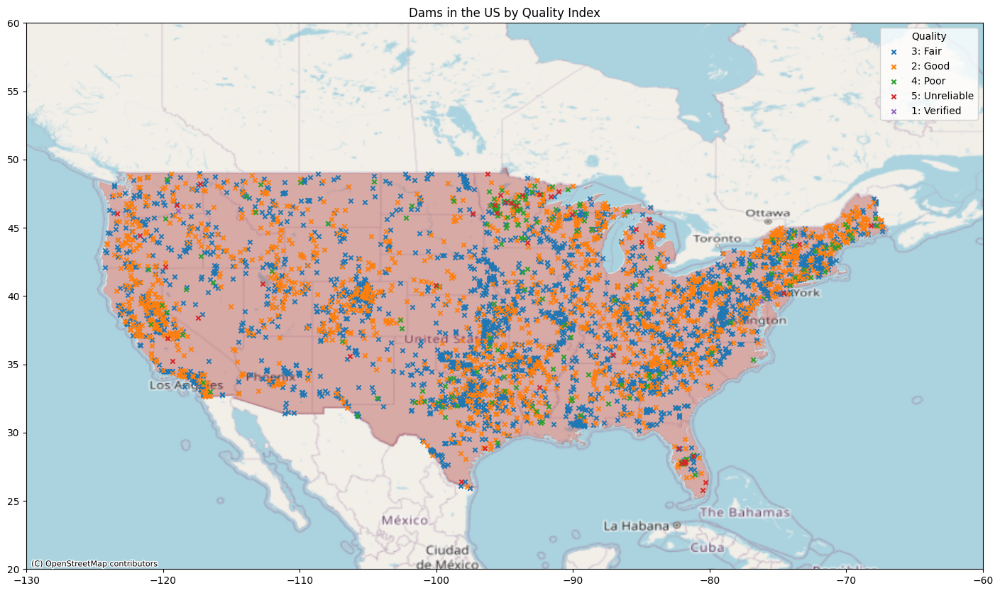

In [19]:
# Cluster dams using the Quality factor
quality_counts = gdf_b_usa['QUALITY'].value_counts()

color_palette = plt.cm.tab10.colors[:len(quality_counts)]

# Create a dictionary mapping quality to color
quality_colors = dict(zip(quality_counts.index, color_palette))

# Plot the dams on a map of Brazil, with each quality represented by a different color
#fig, ax = plt.subplots(figsize=(10, 10))


ax= gdf_states.plot(
    figsize=(30,10),
    #column="NAME",
    #cmap="RdGy",
    #k=5,
    color="Brown",
    edgecolor="white",
    linewidth=0.0,
    alpha=0.35,
    legend=True,
)
ax.set_xlim(-130,-60)
ax.set_ylim(20,60)

for quality, color in quality_colors.items():
    gdf_b_usa[gdf_b_usa['QUALITY'] == quality].plot(ax=ax, color=color, markersize=20, marker="x", label=quality)


# Add OpenStreetMap basemap
ctx.add_basemap(ax, crs=gdf_b_usa.crs, source=ctx.providers.OpenStreetMap.Mapnik)

# Add legend
ax.legend(title='Quality')

# Set title
plt.title('Dams in the US by Quality Index')

# Show plot
plt.show()

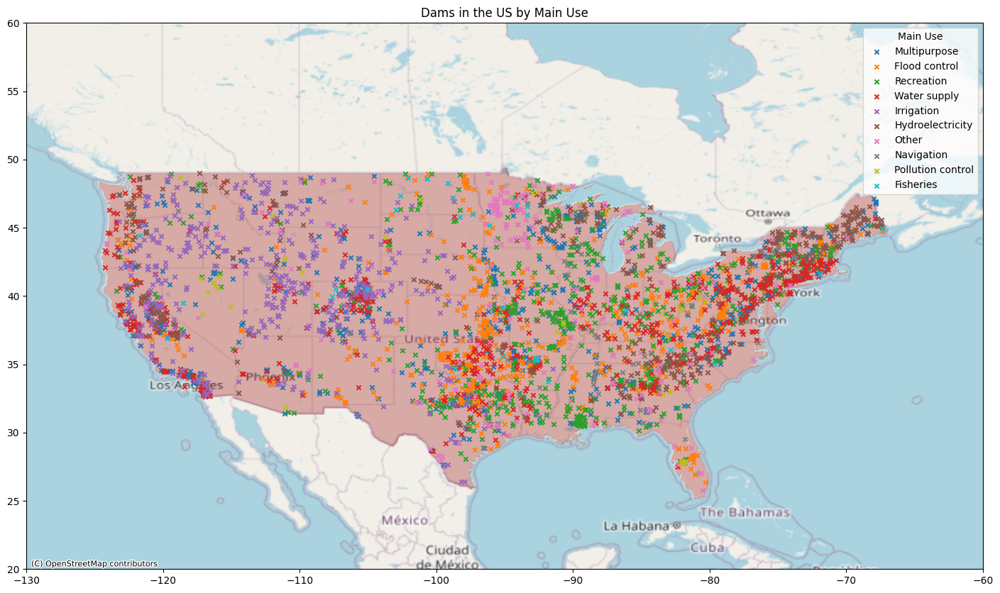

In [20]:
# Plot the Brazil Dams by different Uses

# Create a color palette with a different color for each main use
color_palette = plt.cm.tab10.colors[:len(type_counts)]

# Create a dictionary mapping main use to color
main_use_colors = dict(zip(type_counts.index, color_palette))

# Plot the dams on a map of Brazil, with each main use represented by a different color

ax= gdf_states.plot(
    figsize=(30,10),
    #column="NAME",
    #cmap="RdGy",
    #k=5,
    color="Brown",
    edgecolor="white",
    linewidth=0.0,
    alpha=0.35,
    legend=True,
)
ax.set_xlim(-130,-60)
ax.set_ylim(20,60)
for main_use, color in main_use_colors.items():
    gdf_b_usa[gdf_b_usa['MAIN_USE'] == main_use].plot(ax=ax, color=color, markersize=20, marker="x", label=main_use)

# Add OpenStreetMap basemap
ctx.add_basemap(ax, crs=gdf_b_usa.crs, source=ctx.providers.OpenStreetMap.Mapnik)

# Add legend
ax.legend(title='Main Use')

# Set title
plt.title('Dams in the US by Main Use')

# Show plot
plt.show()

Further Data Cleaning

In [21]:
# Keep only barriers and reservoirs of a height greater or equal 15m ~big dams (https://archive.internationalrivers.org/questions-and-answers-about-large-dams#:~:text=A%3A%20A%20large%20dam%20is%20defined%20by%20the,least%20150%20metres%29%2C%20dam%20volume%20and%20reservoir%20volume.)

# Filter the GeoDataFrame to include only polygons of USA
gdf_b_big = gdf_b_usa[gdf_b_usa['DAM_HGT_M'] >= 15]
gdf_r_big= gdf_r_usa[gdf_r_usa['DAM_HGT_M'] >= 15]


In [22]:
# Data Cleaning
# Remove rows with unreliable and poor 'quality' values
gdf_b_big= gdf_b_big[gdf_b_big['QUALITY'] != "5: Unreliable" ]
gdf_b_big= gdf_b_big[gdf_b_big['QUALITY'] != "4: Poor"]

In [23]:
#gdf_b_usa= gdf_b_usa[gdf_b_usa['MAIN_USE'] != "Hydroelectricity"]

In [24]:
len(gdf_b_big)

3026

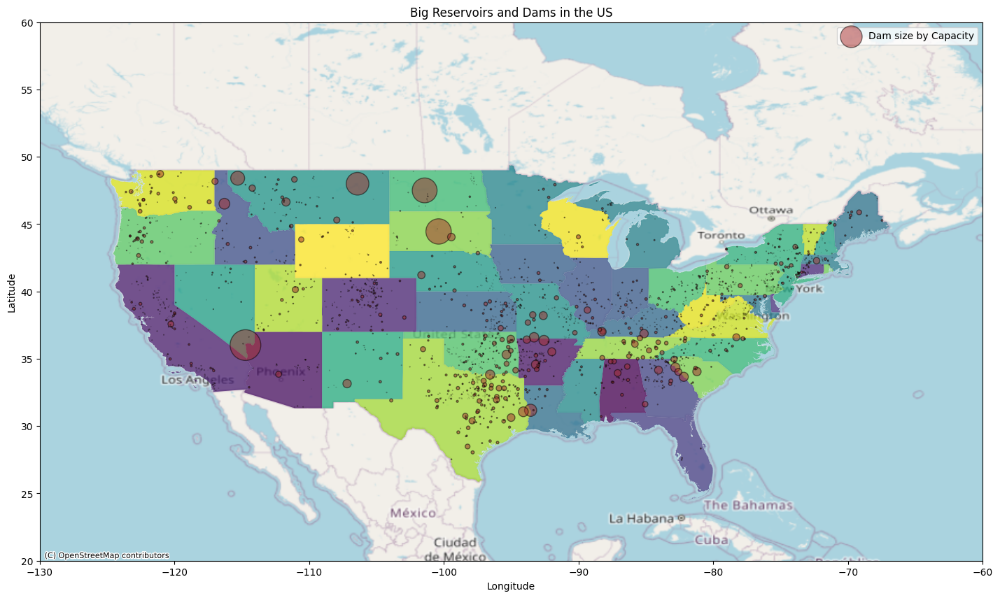

In [25]:
# Combine GeoDataFrames (big reservoirs and dams)
gdf_usa = gpd.GeoDataFrame(pd.concat([gdf_b_big, gdf_r_big], ignore_index=True))

gdf_b_big['size']= gdf_b_big['CAP_REP'] / gdf_b_big['CAP_REP'].max() * 1000

# Assuming 'marker_size' is a column in gdf_b_big with desired marker sizes


ax= gdf_states.plot(
    figsize=(30,10),
    column="NAME",
    cmap="viridis",
    #scheme="quantiles",
    k=5,
    edgecolor="white",
    linewidth=0.0,
    alpha=0.75,
    legend=True,
)

ax.set_xlim(-130,-60)
ax.set_ylim(20,60)

gdf_b_big.plot(ax=ax, alpha=0.5, edgecolor='k', color='brown', markersize=gdf_b_big['size'], label='Dam size by Capacity')


# Add OpenStreetMap basemap
ctx.add_basemap(ax, crs=gdf_b_big.crs, source=ctx.providers.OpenStreetMap.Mapnik)

# Add legend
ax.legend()

# Set a title
plt.title("Big Reservoirs and Dams in the US")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

#Descriptive Spatial Statistics

Spatial autocorrelation attempts to measure how a single attribute (variable) changes over space; whether alike values cluster together or whether dissimilar values occur close to each other or whether any perceived pattern is in fact likely a result of a spatially random process.



---
**Local Spatial Autocorrelation**

To better understand the underpinnings of local spatial autocorrelation, we return to the Moran Plot as a graphical tool. In this context, it is more intuitive to represent the data in a standardized form, as it will allow us to more easily discern a typology of spatial structure.

A key stage of calculating the spatial autocorrelation between a attribute (variable) is characterising the importance of how close together measurements are. This is often referred to as the weighting function. In most modern software libraries we often calculate the weighting function to characters the proximity relationship between measurements prior to performing the actual statistical test.

It is actually possible to display as a series of maps the weighting function (also referred to as spatial lag) between attribute measurements.

First we will calculate the spatial lag of the CAP_REP varaible.There are a number of ways we can characterise the spatial lag between measurements, for this analysis two technics are compared, the nearest 8 neighbours, and queen contiguity.

The spatial lag shows the relationship between a measurement and its neighbours (in this case nearest 8 neighbours for the nearest 8 neighbours technic). Measurements with a similar spatial lag to its observation value suggest spatial autocorrelation - observations are similar to those close to them. Large differences in spatial lag imply lower spatial autocorrelation as neighbours exhibit large differences to an observation.

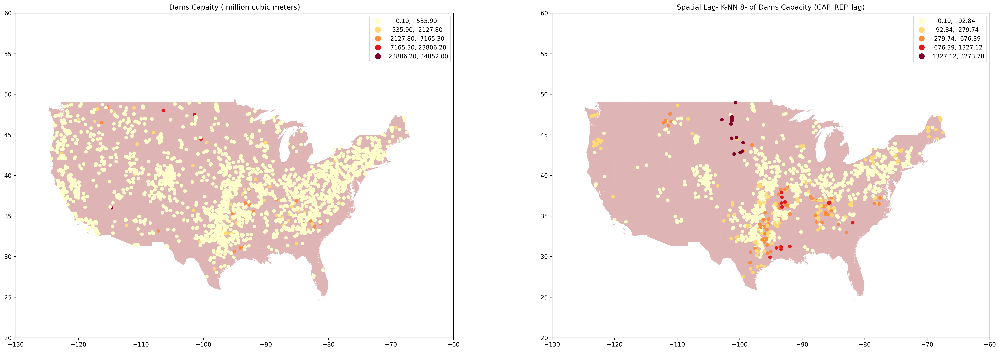

In [26]:
# We can apply this directly to the Geopandas data frame.
from pysal.lib import weights

# Generate W (weights) from the geodataframe using 8 nearest neighbours.
# W is distance to the 8th nearest neighbour
w = weights.KNN.from_dataframe(gdf_b_big, k=8)
# Row-standardization
w.transform = "R"
# Calculate the spatial lag for the CAP_REP varaible using the distance weights in w.
gdf_b_big["CAP_REP_lag"] = weights.lag_spatial(w, gdf_b_big["CAP_REP"])

# Plot the spatial lag alonside the CAP_REP variable.
# Set up the plot size/placement parameters.
f, axs = plt.subplots(nrows=1, ncols=2, figsize=(30, 10), dpi=300)
# Make the axes accessible with single indexing
axs = axs.flatten()
# Plot states
gdf_states.plot(ax=axs[0], column="NAME", color="brown", k=5, edgecolor="white", linewidth=0.0, alpha=0.35, legend=True)
gdf_states.plot(ax=axs[1], column="NAME", color="brown", k=5, edgecolor="white", linewidth=0.0, alpha=0.35, legend=True)

gdf_b_big.plot(column="CAP_REP", scheme="fisherjenks", cmap="YlOrRd", legend=True, linewidth=0, ax=axs[0])
gdf_b_big.plot(column="CAP_REP_lag", scheme="fisherjenks", cmap="YlOrRd", legend=True, linewidth=0, ax=axs[1])

# Set limits
axs[0].set_xlim(-130, -60)
axs[0].set_ylim(20, 60)
axs[1].set_xlim(-130, -60)
axs[1].set_ylim(20, 60)

# Set titles
axs[0].set_title("Dams Capaity ( million cubic meters)")
axs[1].set_title("Spatial Lag- K-NN 8- of Dams Capacity (CAP_REP_lag)")
# Display the figure
plt.show()

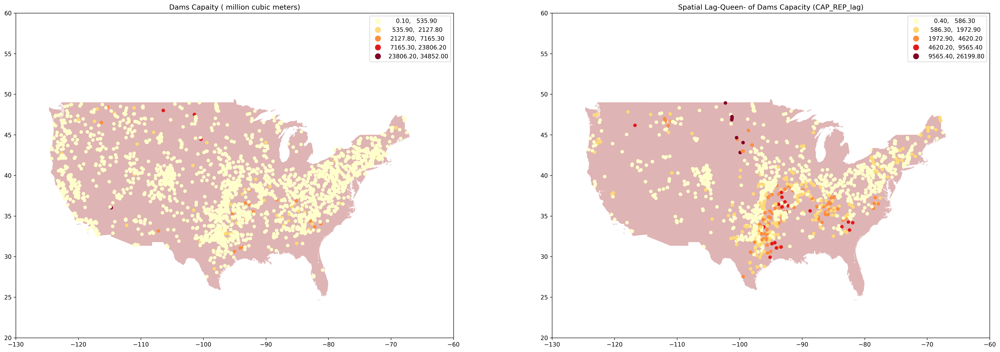

In [27]:
# Create spatial weights matrix (queen contiguity)
w2 = weights.Queen.from_dataframe(gdf_b_big)
# Calculate the spatial lag for the CAP_REP varaible using the distance weights in w.
gdf_b_big["CAP_REP_lag"] = weights.lag_spatial(w2, gdf_b_big["CAP_REP"])

# Set up the plot size/placement parameters.
f, axs = plt.subplots(nrows=1, ncols=2, figsize=(30, 10), dpi=300)
# Make the axes accessible with single indexing
axs = axs.flatten()
# Plot states
gdf_states.plot(ax=axs[0], column="NAME", color="brown", k=5, edgecolor="white", linewidth=0.0, alpha=0.35, legend=True)
gdf_states.plot(ax=axs[1], column="NAME", color="brown", k=5, edgecolor="white", linewidth=0.0, alpha=0.35, legend=True)

gdf_b_big.plot(column="CAP_REP", scheme="fisherjenks", cmap="YlOrRd", legend=True, linewidth=0, ax=axs[0])
gdf_b_big.plot(column="CAP_REP_lag", scheme="fisherjenks", cmap="YlOrRd", legend=True, linewidth=0, ax=axs[1])

# Set limits
axs[0].set_xlim(-130, -60)
axs[0].set_ylim(20, 60)
axs[1].set_xlim(-130, -60)
axs[1].set_ylim(20, 60)

# Set titles
axs[0].set_title("Dams Capaity ( million cubic meters)")
axs[1].set_title("Spatial Lag-Queen- of Dams Capacity (CAP_REP_lag)")
# Display the figure
plt.show()

A visual comparison of the two map plots suggest that in terms of the nearest 8 neighbours there is a relationship between the capacity in a particular dam and the dams within the surrounding neighbourhood. These dams might be in the same catchment, this result aligns with our expectations.

One way we can actually evaluate the relationship between the individual values of the dams and their neighbourhoods is to plot the values as a scatter plot.

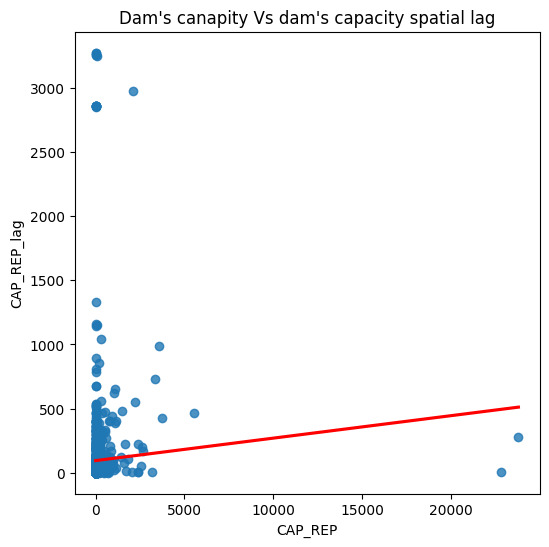

In [28]:
import seaborn as sns
gdf_b_big["CAP_REP_lag"] = weights.lag_spatial(w, gdf_b_big["CAP_REP"])

# Generate a scatterplot between ResAll and corresponding spatial lag values of ResAll
f, axs = plt.subplots(1, figsize=(6, 6))
sns.regplot(x="CAP_REP", y="CAP_REP_lag", ci=None, data=gdf_b_big, line_kws={"color": "r"})
axs.set_title("Dam's canapity Vs dam's capacity spatial lag")
plt.show()

The scatter plot shows that in general that high capacities of dams tend to have a high spatial lag value.

In [29]:
gdf_b_big["CAP_REP"] = weights.lag_spatial(w2, gdf_b_big["CAP_REP"])
gdf_b_big["CAP_REP_std"]= gdf_b_big["CAP_REP"] - gdf_b_big["CAP_REP"].mean()
gdf_b_big["w_CAP_REP_std"]= weights.lag_spatial(w2, gdf_b_big["CAP_REP_std"])

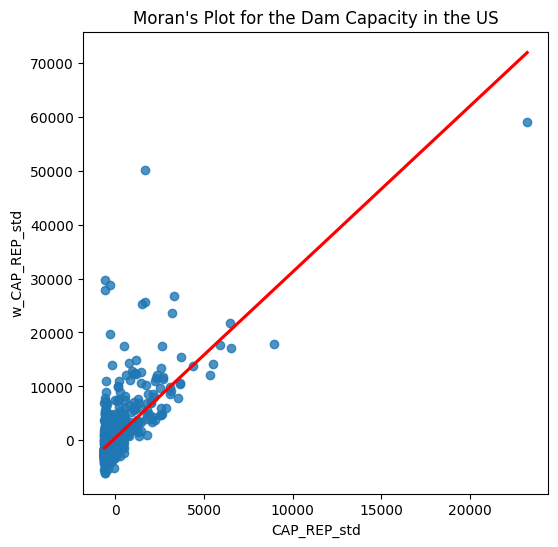

In [30]:
# Set up the figure and axis
f, ax = plt.subplots(1, figsize=(6, 6))
# Plot values
sns.regplot(
    x="CAP_REP_std", y="w_CAP_REP_std", data=gdf_b_big, ci=None, line_kws={"color": "r"})
plt.title("Moran's Plot for the Dam Capacity in the US")
plt.show()

---

**Global Spatial Autocorrelation**

To apply spatial autocorrelation analysis to identify spatial patterns of dam locations in the US and assess the degree of clustering or dispersion, we can use Moran's I statistic. Moran's I measures spatial autocorrelation by examining whether similar values (in this case, dam capacities) are close to each other in space. Positive values of Moran's I indicate clustering, while negative values indicate dispersion.

In [31]:
gdf_b_big = gdf_b_big.dropna(subset=['CAP_REP'])


Spatial Extent:
Bounding Box (minx, miny, maxx, maxy): [-159.46233929   21.97388285  -67.48125      48.924077  ]
Geometry Type: ['Point']

Spatial Distribution:
Number of Features: 1540
Centroid (Longitude, Latitude): -92.58390976154865 38.148457147505894

Spatial Autocorrelation (Moran's I):
Calculated Moran I: 0.2954649102062375
Expected Moran I: -0.000649772579597141
Expected Moran I Varaince: 0.0002255512492316067
Calculated Moran I Z-score: 19.71684053206056
Calculated P-value: 0.001


(<Figure size 1000x400 with 2 Axes>,
 array([<Axes: title={'center': 'Reference Distribution'}, xlabel='Moran I: 0.3', ylabel='Density'>,
        <Axes: title={'center': 'Moran Scatterplot (0.3)'}, xlabel='Attribute', ylabel='Spatial Lag'>],
       dtype=object))

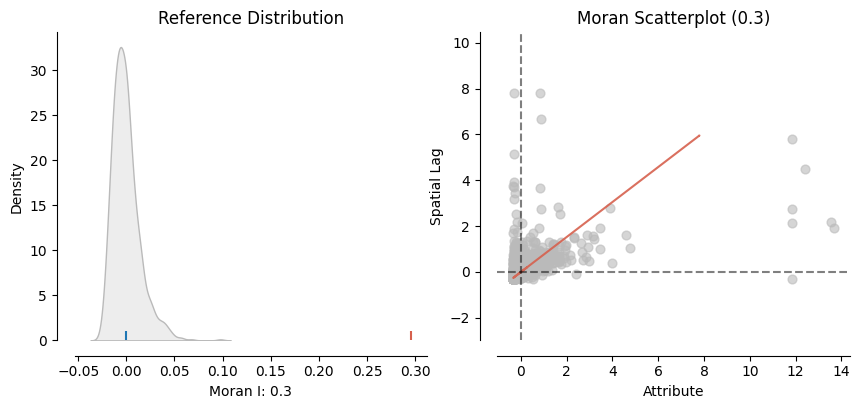

In [32]:
# 1. Spatial extent
print("Spatial Extent:")
print("Bounding Box (minx, miny, maxx, maxy):", gdf_b_big.total_bounds)
print("Geometry Type:", gdf_b_big.geom_type.unique())

# 2. Spatial distribution
print("\nSpatial Distribution:")
print("Number of Features:", len(gdf_b_big))
print("Centroid (Longitude, Latitude):", gdf_b_big.centroid.x.mean(), gdf_b_big.centroid.y.mean())

# 3. Spatial autocorrelation (Moran's I)
from pysal.lib import weights
from pysal.explore import esda
from splot.esda import plot_moran
# Create spatial weights matrix (queen contiguity)
w2 = weights.Queen.from_dataframe(gdf_b_big)

# Compute Moran's I
moran = esda.Moran(gdf_b_big['CAP_REP'], w2)

print("\nSpatial Autocorrelation (Moran's I):")
print("Calculated Moran I:", moran.I)
print("Expected Moran I:", moran.EI)
print("Expected Moran I Varaince:", moran.VI_norm)
print("Calculated Moran I Z-score:", moran.z_norm)
print("Calculated P-value:", moran.p_sim)
plot_moran(moran)

Calculated Moran I: 0.3737836453096771
Expected Moran I: -0.000649772579597141
Expected Moran I Varaince: 0.0001404429286827472
Calculated Moran I Z-score: 31.595458611864288
Calculated P-value: 0.001


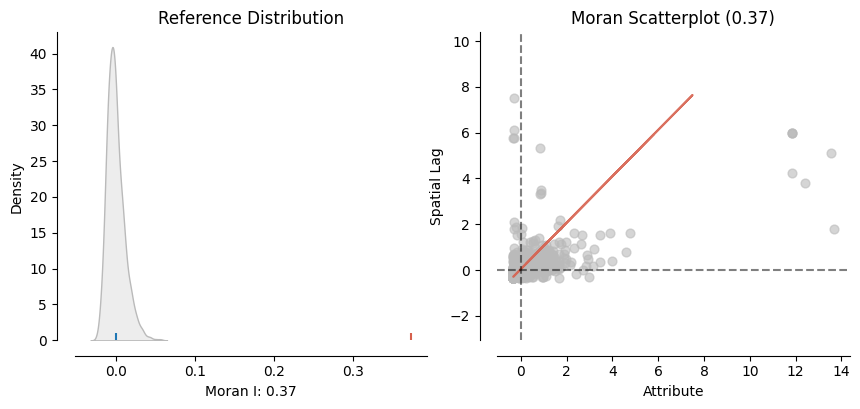

In [33]:
from splot.esda import plot_moran

# Row standardise the weights and calculate Moran's I using the weights.
w = weights.KNN.from_dataframe(gdf_b_big, k=8)
w.transform = "R"
moran = esda.moran.Moran(gdf_b_big["CAP_REP"], w)
# Plot the result and key values.
plot_moran(moran)

print("Calculated Moran I:", moran.I)
print("Expected Moran I:", moran.EI)
print("Expected Moran I Varaince:", moran.VI_norm)
print("Calculated Moran I Z-score:", moran.z_norm)
print("Calculated P-value:", moran.p_sim)

The calculated global Moran’s I value is 0.88 which suggests that there is strong spatial autocorrelation across all the values of dam capacity for the Output Areas.This means that similar values of the variable (dams capacity in this case) tend to cluster together in space.
However, this value needs to be considered in relation to the Expected Moran I value (which is a small negative number ~-0.0004) and the expected variance around the expected Moran I value (which is very small ~8.66e-05). Given that the expected random variance around the expected random mean is so low it actually transpires that for the dam capacity attribute there is statistically significant spatial autocorrelation (on the basis of the weighting function used: 8 nearest neighbours). Indeed the Z-score is 94.31 which is much higher than that needed at a 95% significance; the p-value is 0.001 meaning that there is a 0.999 probability (99.9%) that the spatial pattern of the ResAlldam Capacity attribute is not the result of a random process. As such, we can reject the null hypothesis for the capacity attribute at 95% (0.95) and accept that there is a statistically significant spatial clustering of dam capacity values for the Output Areas of the US.

---
**Local Spatial Autocorrolation**

Hot and Cold Spots

In [34]:
pts = gdf_b_big.centroid
xys = pd.DataFrame({"X": pts.x, "Y": pts.y})
min_thr = weights.util.min_threshold_distance(xys)
w_db = weights.DistanceBand.from_dataframe(gdf_b_big, min_thr)

#Hot/Cold spots using the Queen contiguity for weight calculation
gao = esda.getisord.G(gdf_b_big["CAP_REP"], w)
#print(
#    "Getis & Ord G: %.3f | Pseudo P-value: %.3f" % (gao.G, gao.p_sim)
#)

from esda.getisord import G_Local
# Gi
go_i = G_Local(gdf_b_big["CAP_REP"], w)
# Gi*
go_i_star = G_Local(gdf_b_big["CAP_REP"], w, star=True)


In [35]:
def g_map(g, db, ax):
    """
    Create a cluster map
    ...

    Arguments
    ---------
    g      : G_Local
             Object from the computation of the G statistic
    db     : GeoDataFrame
             Table aligned with values in `g` and containing
             the geometries to plot
    ax     : AxesSubplot
             `matplotlib` axis to draw the map on

    Returns
    -------
    ax     : AxesSubplot
             Axis with the map drawn
    """
    ec = "0.8"

    # Break observations into significant or not
    sig = g.p_sim < 0.05


    # Plot non-significant clusters
    ns = db.loc[sig == False, "geometry"]
    ns.plot(ax=ax, color="lightgrey", edgecolor=ec, linewidth=0.1)
    # Plot HH clusters
    hh = db.loc[(g.Zs > 0) & (sig == True), "geometry"]
    hh.plot(ax=ax, color="red", edgecolor=ec, linewidth=0.1)
    # Plot LL clusters
    ll = db.loc[(g.Zs < 0) & (sig == True), "geometry"]
    ll.plot(ax=ax, color="blue", edgecolor=ec, linewidth=0.1)
    ctx.add_basemap(
        ax,
        crs=db.crs,
        source=ctx.providers.OpenStreetMap.Mapnik
    )
    # Flag to add a star to the title if it's G_i*
    st = ""
    if g.star:
        st = "*"
    # Add title
    ax.set_title(f"G{st} statistic for ResAll @ 0.05", size=15)
    # Add the lim to the axis
    ax.set_xlim(-130, -60)
    ax.set_ylim(20, 60)
    # Remove axis for aesthetics
    ax.set_axis_off()

    return ax

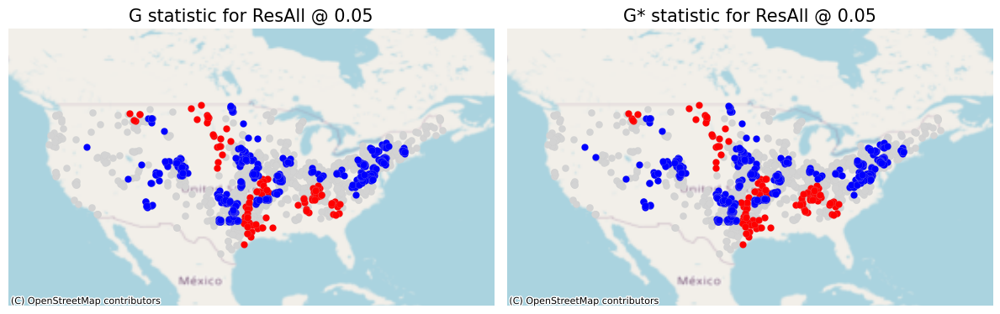

In [36]:
# Set up figure and axes
f, axs = plt.subplots(1, 2, figsize=(12, 6))
# Loop over the two statistics
for g, ax in zip([go_i, go_i_star], axs.flatten()):
    # Generate the statistic's map
    ax = g_map(g, gdf_b_big, ax)
# Tight layout to minimise blank spaces
f.tight_layout()

#plt.title("Hot and Cold Spots of Dams Capacity")
# Render
plt.show()

Both of the Getis and Ord maps show statistically significant hotspots in red and statistically signifcant cold spots in blue for a significance level of 0.05 (95%).
An initial observation is that there really is very little difference between the Gi form of the test (where tested values are omitted) and the Gi* version (where tested values are included).
More interestingly though is the spatial pattern of the hot and cold spots. The hot spots seem to be predominantly ‘clustered’ in the South East and North West (with a few smaller cold spots). However, cold spot seem to comprise of the North East with major states such as New York, Pennyslvania, Main, Ohio and Chicago.


In [37]:
# Gi
go_i = G_Local(gdf_b_big["CAP_REP"], w2)
# Gi*
go_i_star = G_Local(gdf_b_big["CAP_REP"], w2, star=True)


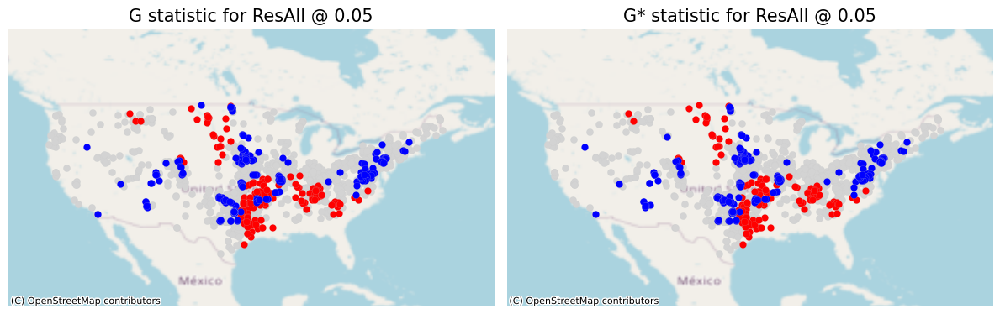

In [38]:
# Set up figure and axes
f, axs = plt.subplots(1, 2, figsize=(12, 6))
# Loop over the two statistics
for g, ax in zip([go_i, go_i_star], axs.flatten()):
    # Generate the statistic's map
    ax = g_map(g, gdf_b_big, ax)
# Tight layout to minimise blank spaces
f.tight_layout()

#plt.title("Hot and Cold Spots of Dams Capacity")
# Render
plt.show()

**Anselin's Local Moran**

In [39]:
from splot import esda as esdaplot
# Calculate the weights - inverse of distance to all features in this instance.
# Row standardise the weights
w = weights.KNN.from_dataframe(gdf_b_big, k=8)
w.transform = "R"
# Calculate Anslin's local Moran's I.
moran_local = esda.moran.Moran_Local(gdf_b_big["CAP_REP"], w)

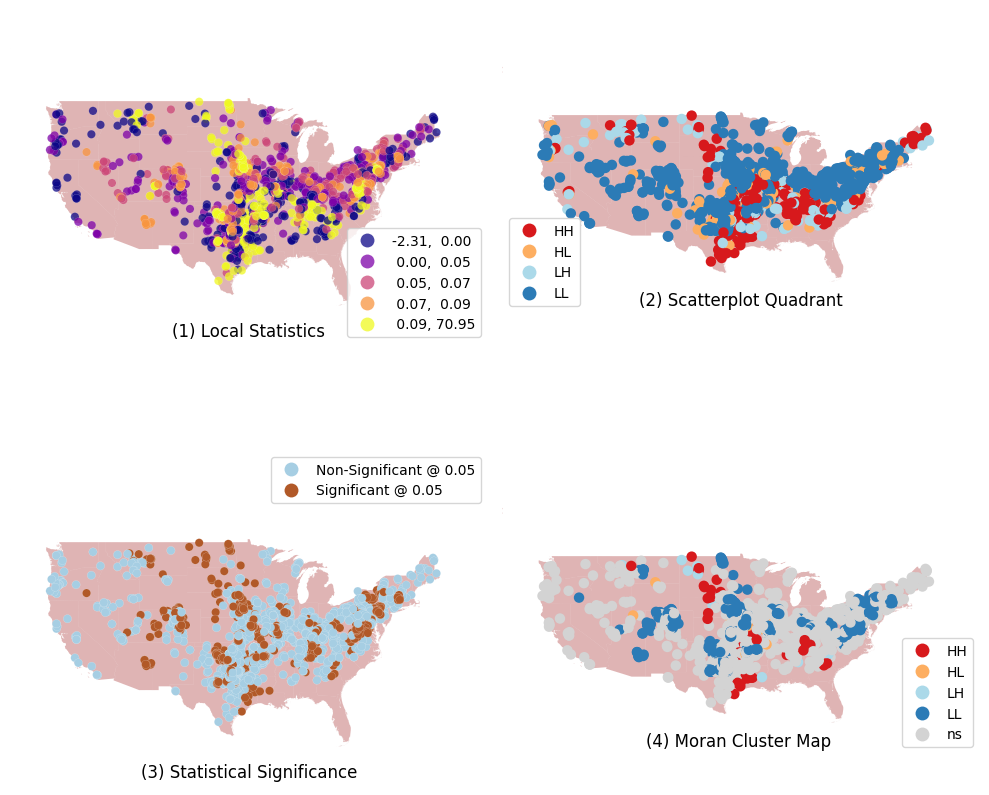

In [40]:
# Set up figure and axes with equal aspect ratio
f, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 10), gridspec_kw={'width_ratios': [1, 1], 'height_ratios': [1, 1]})
# Make the axes accessible with single indexing
axs = axs.flatten()

# Plot states
gdf_states.plot(ax=axs[0], column="NAME", color="brown", k=5, edgecolor="white", linewidth=0.0, alpha=0.35, legend=True)

# Subplot 1 #
# Choropleth of local statistics
# Grab first axis in the figure
ax = axs[0]
# Assign new column with local statistics on-the-fly
gdf_b_big.assign(
    MoranLocal=moran_local.Is
    # Plot choropleth of local statistics
).plot(
    column="MoranLocal",
    cmap="plasma",
    scheme="quantiles",
    k=5,
    edgecolor="white",
    linewidth=0.1,
    alpha=0.75,
    legend=True,
    ax=ax,
)

# Subplot 2 #
# Quadrant categories
# Grab second axis of local statistics
gdf_states.plot(ax=axs[1], column="NAME", color="brown", k=5, edgecolor="white", linewidth=0.0, alpha=0.35, legend=True)

ax = axs[1]
# Plot Quadrant colors (note to ensure all polygons are assigned a
# quadrant, we "trick" the function by setting significance level to
# 1 so all observations are treated as "significant" and thus assigned
# a quadrant color
esdaplot.lisa_cluster(moran_local, gdf_b_big, p=1, ax=ax)

# Subplot 3 #
# Significance map
# Grab third axis of local statistics
# Plot states

gdf_states.plot(ax=axs[2], column="NAME", color="brown", k=5, edgecolor="white", linewidth=0.0, alpha=0.35, legend=True)
ax = axs[2]
#
# Find out significant observations
labels = pd.Series(
    1 * (moran_local.p_sim < 0.05),  # Assign 1 if significant, 0 otherwise
    index=gdf_b_big.index  # Use the index in the original data
    # Recode 1 to "Significant and 0 to "Non-significant"
).map({1: "Significant @ 0.05", 0: "Non-Significant @ 0.05"})
# Assign labels to `db` on the fly
gdf_b_big.assign(
    cl=labels
    # Plot choropleth of (non-)significant areas
).plot(
    column="cl",
    categorical=True,
    k=2,
    cmap="Paired",
    linewidth=0.1,
    edgecolor="white",
    legend=True,
    ax=ax,
)

# Subplot 4 #
# Cluster map
# Grab second axis of local statistics

gdf_states.plot(ax=axs[3], column="NAME", color="brown", k=5, edgecolor="white", linewidth=0.0, alpha=0.35, legend=True)

ax = axs[3]
# Plot Quadrant colors In this case, we use a 5% significance
# level to select polygons as part of statistically significant
# clusters
esdaplot.lisa_cluster(moran_local, gdf_b_big, p=0.05, ax=ax)

# Figure styling #
# Set title to each subplot
for i, ax in enumerate(axs.flatten()):
    ax.set_axis_off()
    ax.set_title(
        [
            "(1) Local Statistics",
            "(2) Scatterplot Quadrant",
            "(3) Statistical Significance",
            "(4) Moran Cluster Map ",
        ][i],
        y=0,
    )

axs[0].set_xlim(-130, -60)
axs[0].set_ylim(20, 60)

axs[1].set_xlim(-130, -60)
axs[1].set_ylim(20, 60)

axs[2].set_xlim(-130, -60)
axs[2].set_ylim(20, 60)

axs[3].set_xlim(-130, -60)
axs[3].set_ylim(20, 60)

# Tight layout to minimize in-between white space
f.tight_layout()

# Display the figure
plt.show()


In [41]:
# Calculate Anslin's local Moran's I with queen
moran_local = esda.moran.Moran_Local(gdf_b_big["CAP_REP"], w2)

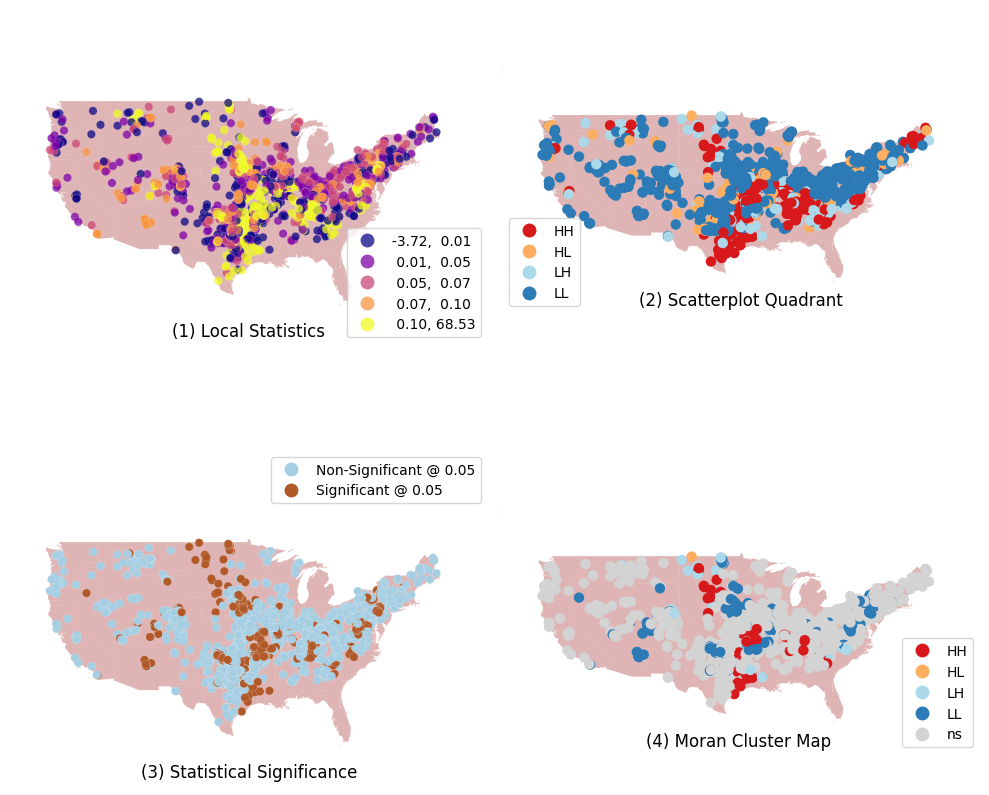

In [42]:
# Set up figure and axes
f, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
# Make the axes accessible with single indexing
axs = axs.flatten()

# Plot states
gdf_states.plot(ax=axs[0], column="NAME", color="brown", k=5, edgecolor="white", linewidth=0.0, alpha=0.35, legend=True)
# Subplot 1 #
# Choropleth of local statistics
# Grab first axis in the figure
ax = axs[0]
# Assign new column with local statistics on-the-fly
gdf_b_big.assign(
    MoranLocal=moran_local.Is
    # Plot choropleth of local statistics
).plot(
    column="MoranLocal",
    cmap="plasma",
    scheme="quantiles",
    k=5,
    edgecolor="white",
    linewidth=0.1,
    alpha=0.75,
    legend=True,
    ax=ax,
)

# Subplot 2 #
# Quadrant categories
# Grab second axis of local statistics
gdf_states.plot(ax=axs[1], column="NAME", color="brown", k=5, edgecolor="white", linewidth=0.0, alpha=0.35, legend=True)

ax = axs[1]
# Plot Quadrant colors (note to ensure all polygons are assigned a
# quadrant, we "trick" the function by setting significance level to
# 1 so all observations are treated as "significant" and thus assigned
# a quadrant color
esdaplot.lisa_cluster(moran_local, gdf_b_big, p=1, ax=ax)

# Subplot 3 #
# Significance map
# Grab third axis of local statistics
# Plot states

gdf_states.plot(ax=axs[2], column="NAME", color="brown", k=5, edgecolor="white", linewidth=0.0, alpha=0.35, legend=True)
ax = axs[2]
#
# Find out significant observations
labels = pd.Series(
    1 * (moran_local.p_sim < 0.05),  # Assign 1 if significant, 0 otherwise
    index=gdf_b_big.index  # Use the index in the original data
    # Recode 1 to "Significant and 0 to "Non-significant"
).map({1: "Significant @ 0.05", 0: "Non-Significant @ 0.05"})
# Assign labels to `db` on the fly
gdf_b_big.assign(
    cl=labels
    # Plot choropleth of (non-)significant areas
).plot(
    column="cl",
    categorical=True,
    k=2,
    cmap="Paired",
    linewidth=0.1,
    edgecolor="white",
    legend=True,
    ax=ax,
)

# Subplot 4 #
# Cluster map
# Grab second axis of local statistics

gdf_states.plot(ax=axs[3], column="NAME", color="brown", k=5, edgecolor="white", linewidth=0.0, alpha=0.35, legend=True)

ax = axs[3]
# Plot Quadrant colors In this case, we use a 5% significance
# level to select polygons as part of statistically significant
# clusters
esdaplot.lisa_cluster(moran_local, gdf_b_big, p=0.05, ax=ax)

# Figure styling #
# Set title to each subplot
for i, ax in enumerate(axs.flatten()):
    ax.set_axis_off()
    ax.set_title(
        [
            "(1) Local Statistics",
            "(2) Scatterplot Quadrant",
            "(3) Statistical Significance",
            "(4) Moran Cluster Map ",
        ][i],
        y=0,
    )

axs[0].set_xlim(-130, -60)
axs[0].set_ylim(20, 60)

axs[1].set_xlim(-130, -60)
axs[1].set_ylim(20, 60)

axs[2].set_xlim(-130, -60)
axs[2].set_ylim(20, 60)

axs[3].set_xlim(-130, -60)
axs[3].set_ylim(20, 60)
# Tight layout to minimize in-between white space
f.tight_layout()

# Display the figure
plt.show()

Stepping through the plotted maps in order provides an increasing level of detail regarding the results of the Anslin’s local Moran I test.
Map (1) shows the actual calculated Anslin local Moran I value for each dam on the basis of its similarity and spatial lag to all the other dams in the dataset (based on a KNN weighting). We can see that local Moran I values range from -0.40 through to 79.53. The local Moran I value themselves are not particularly helpful in interpreting the nature of the spatial autocorrelation an individual feature may be exhibiting.

Map (2) has taken the local Moran I values and assigned each dam to one of 4 categories; whether its local Moran I value falls within the range of values that indicate High-High association, Low-Low, High-Low or Low-High association with the other dams. Note, that I have avoided using the term spatial autocorrelation here, as this map does not show statistically significant dam; it shows the broad pattern of association of an individual dams to all the other dams in the data-set. A comparison of map (1) with map (2) shows that High-High and Low-Low are indicated by positive local Moran I values, while high-low and low-high are indicated by negative local Moran I values. Thus, positive local Moran I values imply homogeneity while negative imply heterogeneity.

However, as already noted not all of the associations in map (2) will be statistically significant at the chosen significance level of 0.05 (95%). Map (3) shows those dams that are actually statistically significant at a significance level of 0.05. These doesn't seem to be grouped within the country in any specific area.

Map (4) reveals quite a complex pattern of spatial autocorrelation in terms of statistically significant dams. North West shows a large number of High-High significant dams, with a few large areas being statistically significant Low-High.

---
**Point patterns**

In [43]:
def coord_lister(geom):
    coords = list(geom.coords)
    return (coords)

# Extract the latitude and longitude coordinates
coords= gdf_b_big.geometry.apply(coord_lister)

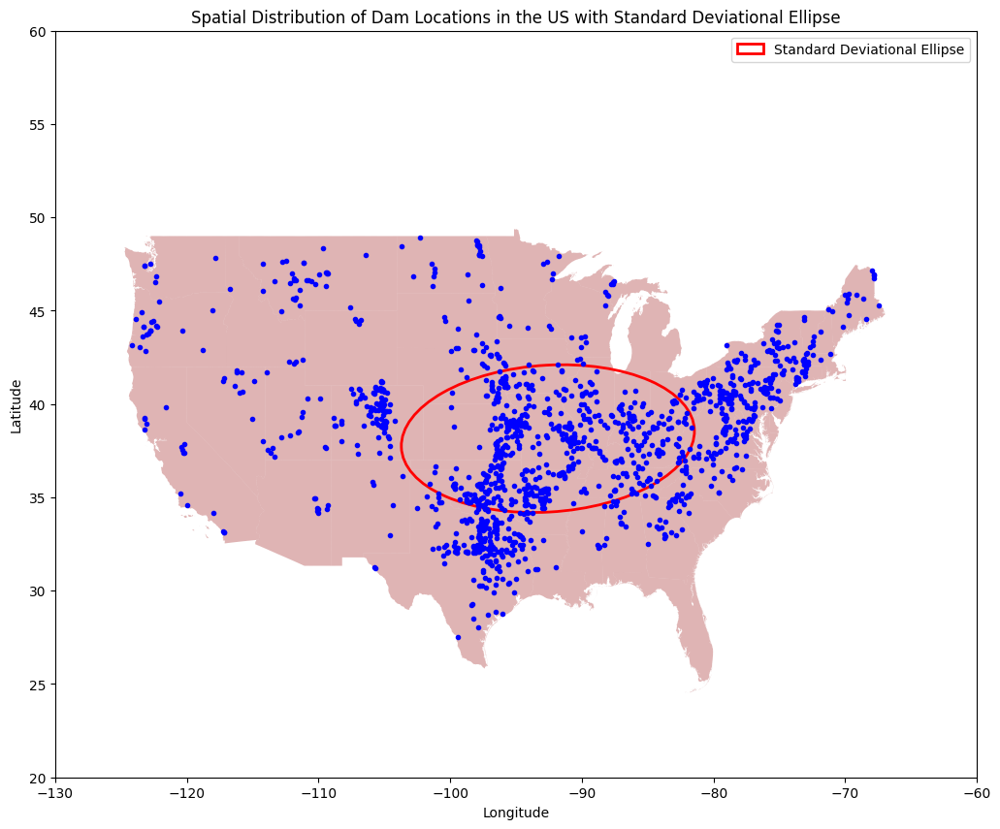

In [44]:
# Standard Deviational Ellipse

from matplotlib.patches import Ellipse

# Apply the coord_lister function to extract the coordinates
coords =gdf_b_big.geometry.apply(coord_lister)

# Flatten the list of coordinate tuples
flat_coords = [item for sublist in coords for item in sublist]

# Convert the flattened coordinates to a numpy array
coordinates = np.array(flat_coords)

# Compute the centroid of the dam locations
centroid = np.mean(coordinates, axis=0)

# Compute the covariance matrix of the dam locations
covariance_matrix = np.cov(coordinates, rowvar=False)

# Compute the eigenvalues and eigenvectors of the covariance matrix
eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)

# Find the index of the largest eigenvalue
max_eigenvalue_index = np.argmax(eigenvalues)

# Get the corresponding eigenvector (principal axis)
principal_axis = eigenvectors[:, max_eigenvalue_index]

# Compute the angle of rotation of the ellipse
angle = np.degrees(np.arctan2(principal_axis[1], principal_axis[0]))

# Compute the lengths of the semi-major and semi-minor axes
semi_major_axis_length = 2 * np.sqrt(eigenvalues[max_eigenvalue_index])
semi_minor_axis_length = 2 * np.sqrt(eigenvalues[1 - max_eigenvalue_index])

# Plot the dam locations
fig, ax = plt.subplots(figsize=(30, 10))

gdf_states.plot( ax=ax, column="NAME", color="brown", k=5, edgecolor="white", linewidth=0.0, alpha=0.35, legend=True)

for geom in coords:
    x, y = zip(*geom)
    plt.plot(x, y, 'b.')

# Plot the Standard Deviational Ellipse
ellipse = Ellipse(xy=centroid, width=semi_major_axis_length, height=semi_minor_axis_length,
                  angle=angle, edgecolor='r', fc='None', lw=2, label='Standard Deviational Ellipse')

plt.gca().add_patch(ellipse)

# Set plot labels and legend
plt.xlim(-130,-60)
plt.ylim(20,60)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Spatial Distribution of Dam Locations in the US with Standard Deviational Ellipse')
plt.legend()

plt.show()

In [45]:
from pointpats import centrography

import numpy as np


# Extract the latitude and longitude coordinates
x_coords = [point[0] for row in coords for point in row]
y_coords = [point[1] for row in coords for point in row]

# Calculate mean center
mean_center = centrography.mean_center(np.array(list(zip(x_coords, y_coords))))

# Calculate median center
med_center = centrography.euclidean_median(np.array(list(zip(x_coords, y_coords))))

print("Mean Center (x, y):", mean_center)
print("Median Center (x, y):", med_center)

Mean Center (x, y): [-92.58390976  38.14845715]
Median Center (x, y): [-93.27399728  37.24755404]


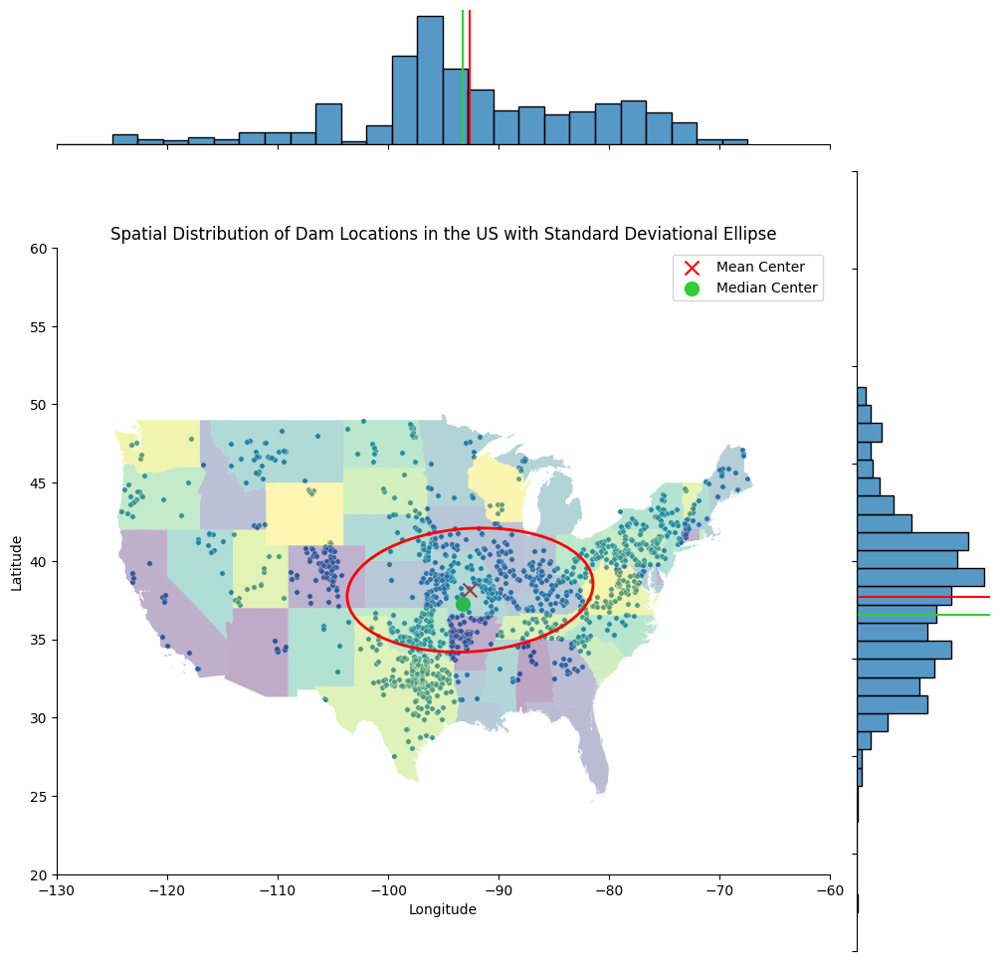

In [57]:
# Create jointplot
joint_axes = sns.jointplot(
    x=x_coords, y=y_coords, data=gdf_b_big, s=15, height=10
)

# Add mean point and marginal lines
joint_axes.ax_joint.scatter(
    *mean_center, color="red", marker="x", s=100, label="Mean Center"
)
joint_axes.ax_marg_x.axvline(mean_center[0], color="red")
joint_axes.ax_marg_y.axhline(mean_center[1], color="red")

# Add median point and marginal lines
joint_axes.ax_joint.scatter(
    *med_center, color="limegreen", marker="o", s=100, label="Median Center"
)
joint_axes.ax_marg_x.axvline(med_center[0], color="limegreen")
joint_axes.ax_marg_y.axhline(med_center[1], color="limegreen")

# Legend
joint_axes.ax_joint.legend()

# Add states plot
ax_states = plt.subplot(joint_axes.ax_joint.get_subplotspec())
gdf_states.plot(
    ax=ax_states, column="NAME",
    cmap="viridis",
    #scheme="quantiles",
    k=5,
    edgecolor="white",
    linewidth=0.0,
    alpha=0.35,
    #legend=True,
)

# Standard Deviational Ellipse

# Plot the Standard Deviational Ellipse
ellipse = Ellipse(xy=centroid, width=semi_major_axis_length, height=semi_minor_axis_length,
                  angle=angle, edgecolor='r', fc='None', lw=2, label='Standard Deviational Ellipse')

ax_states.add_patch(ellipse)

# Set plot labels and legend
ax_states.set_xlim(-130, -60)
ax_states.set_ylim(20, 60)
ax_states.set_xlabel('Longitude')
ax_states.set_ylabel('Latitude')
ax_states.set_title('Spatial Distribution of Dam Locations in the US with Standard Deviational Ellipse')

# Display
plt.show()

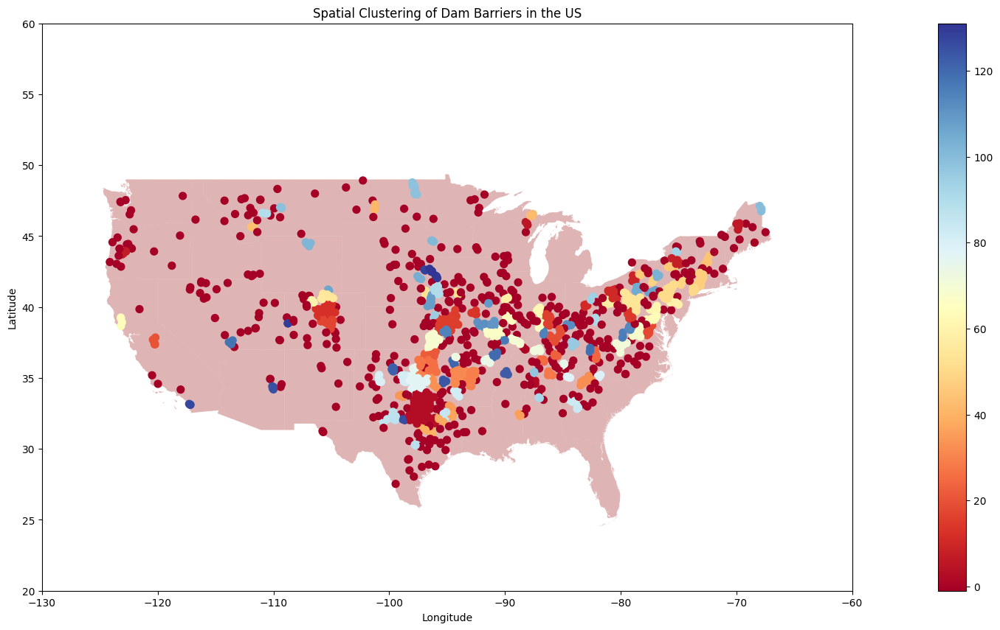

In [48]:
from sklearn.cluster import DBSCAN

coords = np.column_stack((gdf_b_big.geometry.centroid.x, gdf_b_big.geometry.centroid.y))


# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.3, min_samples=3)  # Adjust parameters as needed
clusters = dbscan.fit_predict(coords)

# Add cluster labels to GeoDataFrame
gdf_b_big['cluster'] = clusters

# Plot clustered barriers
fig, ax = plt.subplots(figsize=(30, 10))
# Plot states
gdf_states.plot(ax=ax, column="NAME", color="brown", k=5, edgecolor="white", linewidth=0.0, alpha=0.35, legend=True)
gdf_b_big.plot(ax=ax, column='cluster', legend=True, cmap='RdYlBu', markersize=50)
plt.title("Spatial Clustering of Dam Barriers in the US")
plt.xlim(-130, -60)
plt.ylim(20, 60)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()